In [8]:
import pandas as pd
import numpy as np
import csv
import matplotlib.pyplot as plt
import os

In [2]:
pwd

'/Users/lilafowler/QKESolveCPP'

In [61]:
T_1_results = np.array(pd.read_csv("T=1_QKESolveMPI_results.csv"))

EmptyDataError: No columns to parse from file

In [18]:
not_eq_results = np.array(pd.read_csv("/Users/lilafowler/QKESolveCPP/not_equilibrium_QKESolveMPI_results.csv"))
T2_not_eq_results = np.array(pd.read_csv("/Users/lilafowler/QKESolveCPP/T=2_not_equilibrium_QKESolveMPI_results.csv"))
classical_T2_not_eq_results = np.array(pd.read_csv("/Users/lilafowler/QKESolveCPP/T=2_classical_not_equilibrium_QKESolveMPI_results.csv"))


In [60]:
not_eq_results.shape

(200, 1652)

In [10]:
T_1_results[66]

array([ 9.33669378e+13,  1.37413007e+12,  1.00000000e+00, ...,
       -9.99965571e-03,  1.00000000e+00,  1.00000000e+00])

In [49]:
with open('initialdensity.csv', 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(T_1_results[66])

In [5]:
t_vals = T_1_results[:,0]
px_energy_1 = T_1_results[:,87]
p0_energy_1 = T_1_results[:,6]

In [6]:
t_vals2 = not_eq_results[:,0]
px_energy_2 = not_eq_results[:,87]
p0_energy_2 = not_eq_results[:,6]

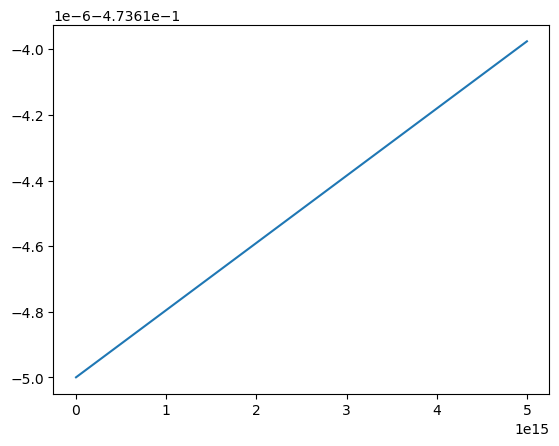

In [34]:
t_vals3 = classical_T2_not_eq_results[:,0]
p0_energy_3 = classical_T2_not_eq_results[:,6]
px_energy_3 = classical_T2_not_eq_results[:,87]
pz_energy_3 = classical_T2_not_eq_results[:,89]

plt.figure()
plt.plot(t_vals3, pz_energy_3)
plt.show()

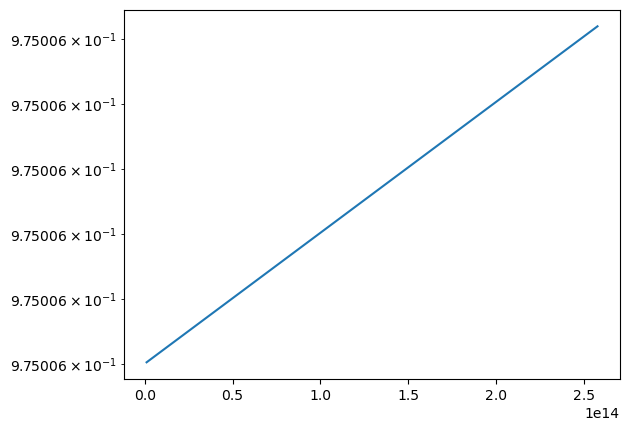

In [7]:
plt.figure()
plt.plot(t_vals, p0_energy_1)
plt.yscale("log")
plt.show()

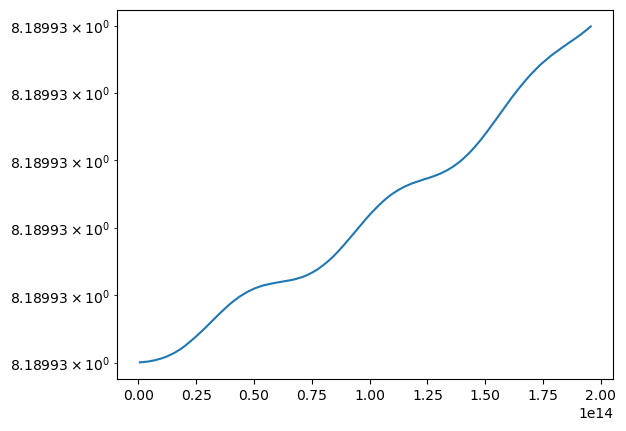

In [8]:
plt.figure()
plt.plot(t_vals2, p0_energy_2)
plt.yscale("log")
plt.show()

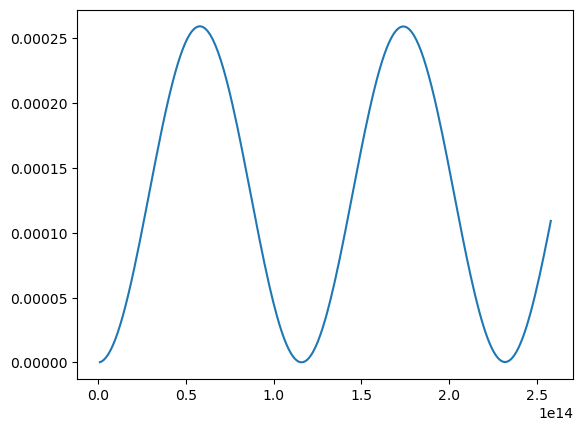

In [9]:
plt.figure()
plt.plot(t_vals, px_energy_1)
plt.show()

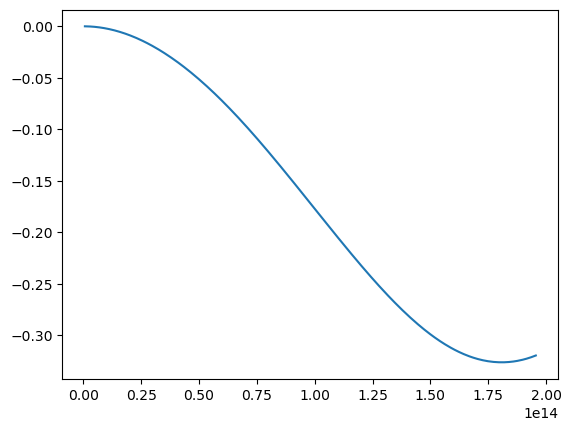

In [10]:
plt.figure()
plt.plot(t_vals2, px_energy_2)
plt.show()

In [11]:
def get_p0_pz(input_array, time_1, time_2, time_3):
    p0_energy_time0 = []
    p0_energy_time100 = []
    p0_energy_time200 = []
    for i in range(2, int(len(input_array[0,:])/2), 4):
        p0_energy_time0.append(input_array[time_1,i])
        p0_energy_time100.append(input_array[time_2,i])
        p0_energy_time200.append(input_array[time_3,i])

    pz_energy_time0 = []
    pz_energy_time100 = []
    pz_energy_time200 = []
    for i in range(5, int(len(input_array[0,:])/2), 4):
        pz_energy_time0.append(input_array[time_1,i])
        pz_energy_time100.append(input_array[time_2,i])
        pz_energy_time200.append(input_array[time_3,i])
        
    return [p0_energy_time0, p0_energy_time100, p0_energy_time200], [pz_energy_time0, pz_energy_time100, pz_energy_time200]

In [16]:
def get_f_nu_mu(p0_energies, pz_energies):
    f_nu_time0 = []
    f_mu_time0 = []
    f_nu_time100 = []
    f_mu_time100 = []
    f_nu_time200 = []
    f_mu_time200 = []
    for i in range(len(p0_energies[0])):
        f_nu_time0.append(0.5 * p0_energies[0][i] + 0.5 * p0_energies[0][i] * pz_energies[0][i])
        f_mu_time0.append(0.5 * p0_energies[0][i] - 0.5 * p0_energies[0][i] * pz_energies[0][i])
        f_nu_time100.append(0.5 * p0_energies[1][i] + 0.5 * p0_energies[1][i] * pz_energies[1][i])
        f_mu_time100.append(0.5 * p0_energies[1][i] - 0.5 * p0_energies[1][i] * pz_energies[1][i])
        f_nu_time200.append(0.5 * p0_energies[2][i] + 0.5 * p0_energies[2][i] * pz_energies[2][i])
        f_mu_time200.append(0.5 * p0_energies[2][i] - 0.5 * p0_energies[2][i] * pz_energies[2][i])
    return [f_nu_time0, f_nu_time100, f_nu_time200], [f_mu_time0, f_mu_time100, f_mu_time200]

In [17]:
def number_densities(f_nus, f_mus, e_vals):
    electron_number_0 = []
    muon_number_0 = []
    electron_number_100 = []
    muon_number_100 = []
    electron_number_200 = []
    muon_number_200 = []

    for i in range(201):
        electron_number_0.append(f_nus[0][i] * e_vals[i]**2)
        muon_number_0.append(f_mus[0][i] * e_vals[i]**2)
        electron_number_100.append(f_nus[1][i] * e_vals[i]**2)
        muon_number_100.append(f_mus[1][i] * e_vals[i]**2)
        electron_number_200.append(f_nus[2][i] * e_vals[i]**2)
        muon_number_200.append(f_mus[2][i] * e_vals[i]**2)
    return [electron_number_0, electron_number_100, electron_number_200], [muon_number_0, muon_number_100, muon_number_200]

In [35]:
def plot_number_densities(title, electron_or_muon, input_array, xvals, time1, time2, time3):
    p0s, pzs = get_p0_pz(input_array, time1, time2, time3)
    fnus, fmus = get_f_nu_mu(p0s, pzs)
    electrons, muons = number_densities(fnus, fmus, xvals)
    
    plt.figure()
    tvals = xvals
    if(electron_or_muon=="electron"):
        yvals1 = electrons[0]
        yvals2 = electrons[1]
        yvals3 = electrons[2]
    else:
        yvals1 = muons[0]
        yvals2 = muons[1]
        yvals3 = muons[2]
    plt.plot(tvals, yvals1, label=" time "+str(time1))
    plt.plot(tvals, yvals2, label=" time "+str(time2))
    plt.plot(tvals, yvals3, label=" time "+str(time3))
    plt.legend()
    plt.title(title)
    plt.show()
    return electrons, muons

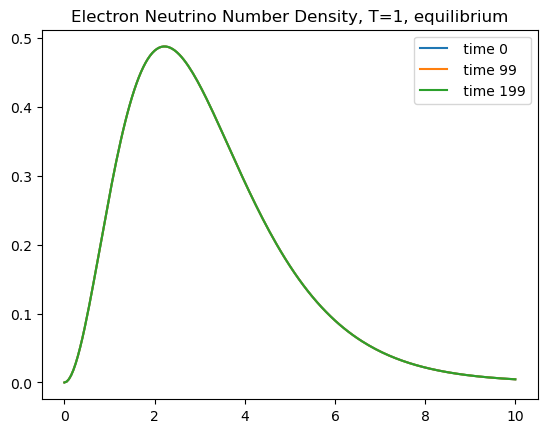

In [52]:
electron, muon = plot_number_densities("Electron Neutrino Number Density, T=1, equilibrium", "electron", T_1_results, np.linspace(0,10,201), 0, 99, 199)


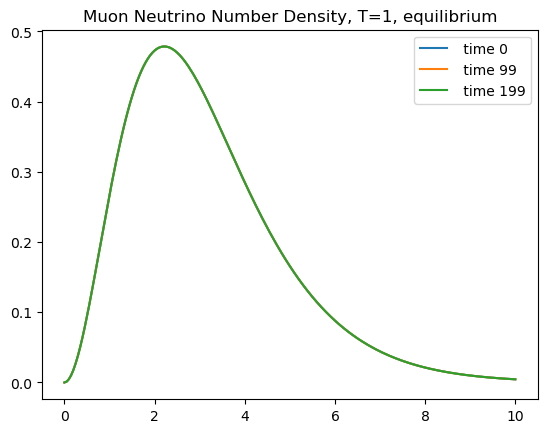

In [53]:
electron, muon = plot_number_densities("Muon Neutrino Number Density, T=1, equilibrium", "muon", T_1_results, np.linspace(0,10,201), 0, 99, 199)


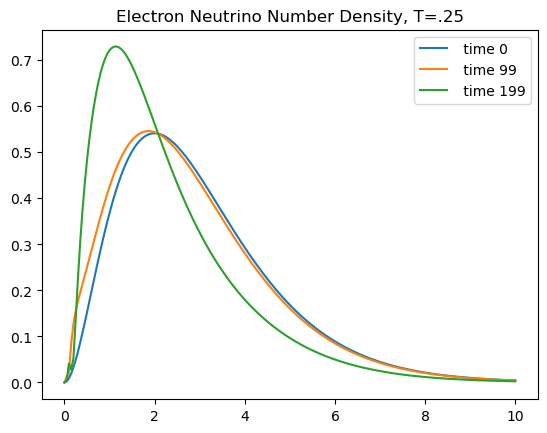

In [54]:
electron, muon = plot_number_densities("Electron Neutrino Number Density, T=.25", "electron", not_eq_results, np.linspace(0,10,201), 0, 99, 199)

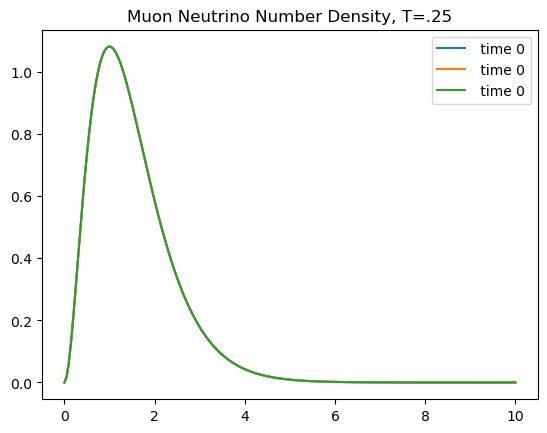

In [55]:
electron, muon = plot_number_densities("Muon Neutrino Number Density, T=.25", "muon", not_eq_results, np.linspace(0,10,201), 0, 0, 0)


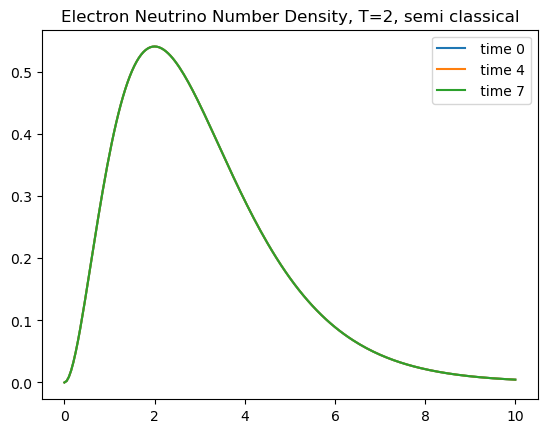

In [56]:
electron, muon = plot_number_densities("Electron Neutrino Number Density, T=2, semi classical", "electron", classical_T2_not_eq_results, np.linspace(0,10,201), 0, 4, 7)


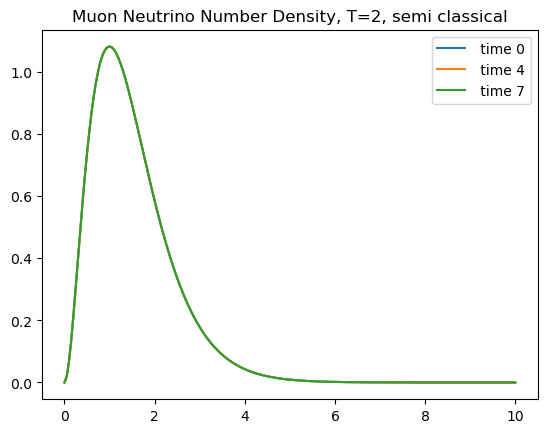

In [57]:
electron, muon = plot_number_densities("Muon Neutrino Number Density, T=2, semi classical", "muon", classical_T2_not_eq_results, np.linspace(0,10,201), 0, 4, 7)


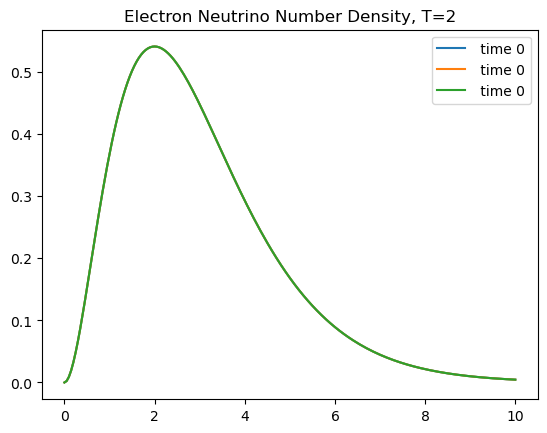

In [58]:
electron, muon = plot_number_densities("Electron Neutrino Number Density, T=2", "electron", T2_not_eq_results, np.linspace(0,10,201), 0,0, 0)


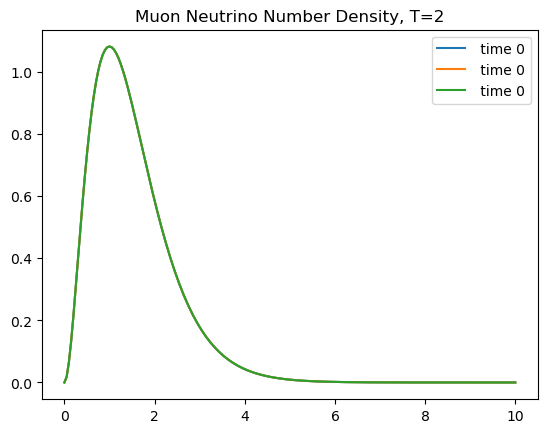

In [59]:
electron, muon = plot_number_densities("Muon Neutrino Number Density, T=2", "muon", T2_not_eq_results, np.linspace(0,10,201), 0,0, 0)


In [48]:
fake_thermal = []
fake_e = np.linspace(0,10,201)
for i in range(201):
    fake_thermal.append(fake_e[i]**2/(np.exp(fake_e[i]/0.9433)+1))

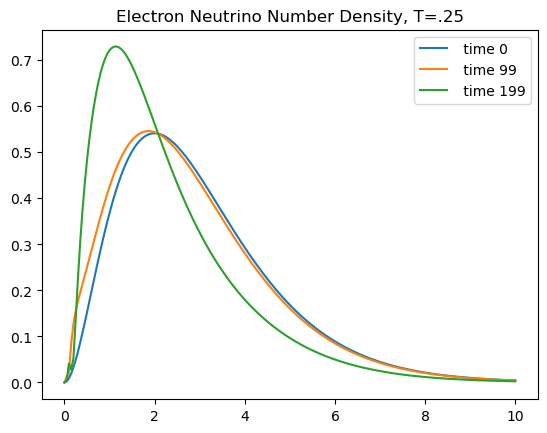

In [49]:
electrons, muons = plot_number_densities("Electron Neutrino Number Density, T=.25", "electron", not_eq_results, np.linspace(0,10,201), 0, 99, 199)


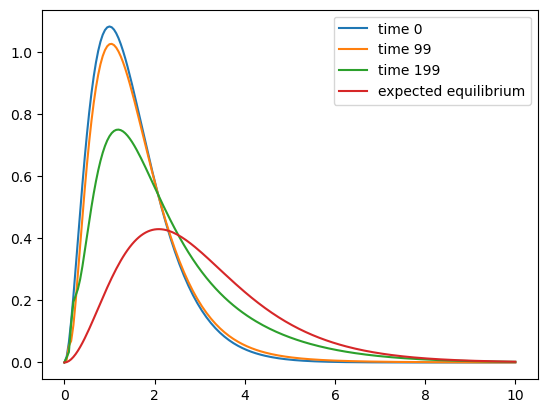

In [51]:
plt.figure()
plt.plot(np.linspace(0,10,201), muons[0], label="time 0")
plt.plot(np.linspace(0,10,201), muons[1], label="time 99")
plt.plot(np.linspace(0,10,201), muons[2], label="time 199")
plt.plot(np.linspace(0,10,201), fake_thermal, label="expected equilibrium")
plt.legend()
plt.show()

In [24]:
initialdens = np.array(pd.read_csv("/Users/lilafowler/QKESolveCPP/initialdensity.csv"))


In [9]:
path = '/Users/lilafowler/QKESolveCPP'

In [10]:
os.path.isfile("initialdensity.csv")

True

In [14]:
myfile = open("initialdensity.csv", 'r')

In [15]:
myfile.readlines()

['5000000000000000000,  158983679795032800,  9,  0,  0,  -0.77777799999999996938271351609728299081325531005859,  8.1910735534290690651459954096935689449310302734375,  0,  0,  -0.76370475778119184528947016588062979280948638916016,  7.4488838966563033494594492367468774318695068359375,  0,  0,  -0.74920589735913134532552248856518417596817016601562,  6.7785277994012016478109217132441699504852294921875,  0,  0,  -0.73636202910372638985592175231431610882282257080078,  6.171315770072698825288171065039932727813720703125,  0,  0,  -0.72426668438265917604468313584220595657825469970703,  5.6207797230609086724939515988808125257492065429688,  0,  0,  -0.71248959295995517582156253411085344851016998291016,  5.1213244822429988545309242908842861652374267578125,  0,  0,  -0.70075354679427925841395108363940380513668060302734,  4.668015702738077976619024411775171756744384765625,  0,  0,  -0.68886299301350162327395310057909227907657623291016,  4.2564180074672099962640459125395864248275756835938,  0,  0,  -

In [19]:
myfile.close()

In [22]:
newfile = open("T=2_not_equilibrium_QKESolveMPI_results.csv", 'r')
newfile.readlines()

['0, 1e+12, 9, 0, 0, -0.77777799999999996938271351609728299081325531005859, 8.189930000000000376303432858549058437347412109375, 0, 0, -0.76770799999999994600585750958998687565326690673828, 7.454679999999999751025825389660894870758056640625, 0, 0, -0.75724299999999999943867123874952085316181182861328, 6.787250000000000227373675443232059478759765625, 0, 0, -0.74637500000000001065814103640150278806686401367188, 6.1812899999999997291411091282498091459274291992188, 0, 0, -0.73509400000000002517452912798034958541393280029297, 5.6310500000000001108446667785756289958953857421875, 0, 0, -0.72338999999999997747579527640482410788536071777344, 5.1313100000000000378008735424373298883438110351562, 0, 0, -0.71125599999999999933919525574310682713985443115234, 4.677369999999999805595507496036589145660400390625, 0, 0, -0.69868200000000002525268882891396060585975646972656, 4.2649499999999997967847775726113468408584594726562, 0, 0, -0.68566099999999996494892684495425783097743988037109, 3.89019000000000003

In [23]:
newfile.close()